# **Deep Learning Homework 6: *Variational Autoencoders***
### MSc Computer Science, Data Science, Cybersecurity Computer Engeneering @UniPD
### 2nd semester - 6 ECTS
### Prof. Nicolò Navarin & Prof. Alessandro Sperduti
---

In this homework, we will explore how to develop a Variational Autoencoder (VAE). As a dataset, we will use the MNIST dataset. In developing the VAE we also explore how to develop an ad-hoc layer and a custom training step.

**NOTE**: in order to run this notebook without problems, please connect to a *GPU runtime*. You can do so by clicking on the RAM / Disk icon in the upper right part of the notebook, then on *Change runtime tipe* at the bottom of the page, and then select the GPU hardware accelerator.


### Load Dataset
We load the MNIST dataset, using `tf.keras.datasets`. The dataset contains 60,000 training grayscale images and 10,000 testing image of handwritten digits.

In [1]:
# load necessary libriaries and functions
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt

def plot_loss(history):
  plt.figure(figsize=(10,6))
  plt.subplot(1, 2, 1)
  plt.plot(history.epoch,history.history['reconstruction_loss'])
  plt.title('reconstruction_loss')
  plt.subplot(1, 2, 2)
  plt.plot(history.epoch,history.history['kl_loss'])
  plt.title('kl_loss')
  plt.show()

In [2]:
(x_train_full, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()

# Rescale the pixel values
x_train_full = x_train_full.astype('float32') / 255
x_test = x_test.astype('float32') / 255

# Flatten the arrays
x_train = x_train_full.reshape((len(x_train_full), np.prod(x_train_full.shape[1:])))
x_test = x_test.reshape((len(x_test), np.prod(x_test.shape[1:])))

# In this HW, we will not need a validation set since we will not deal with model selection
# x_valid, y_valid = x_train[:10000], y_train[:10000]
# x_train, y_train = x_train[10000:], y_train[10000:]

11501568/11490434 [==============================] - 0s 0us/step


##[TO COMPLETE] Exercise 6.1: Variational Autoencoder: reparameterization trick
To implement a VAE we have to define 2 main parts: the _Encoder_ and the _Decoder_.
Let's start by the Encoder, that computes an encoding of the input from which it computes the mean and the average of the sample distribution.
Once we have these two statistics, we have to implement the sampling phase. Keras does not provide any predefined method to perform this operation, therefore we have to define it. With the aim to be consistent with the layer-composition paradigm used by Keras in defining a model, we define a Sampling layer as a new layer.

To do this we define a new class that inherits from the layer base class `tf.keras.layers` that is used as base class for all the layers defined in Keras. In more detail, from this class we are interested in overriding the *call* method, that is the one that is called when a layer is exploited by the model, and where the operations executed by the layer are defined.

In our case, the Sampling layer has in input the tuple made of the mean and the log-variance, and it has to compute the sample $z$ from them by exploiting the reparameterization trick:
$$
z=z_{mean} + exp(z_{var}/2) * \epsilon
$$
The reparameterization trick is used in VAE because it actually helps in the backpropagation process. Specifically, $\epsilon \sim \mathcal{N}(0,1)$ actually reparameterizes our VAE network. This allows the mean and log-variance vectors to still remain as the learnable parameters of the network while  maintaining the stochasticity of the entire system via epsilon.

**[TO COMPLETE]**: complete the code defining the Sampling layer that implements the reparametrization trick.

**Hint**: to generate random values from a normal distribution you can use the keras [tf.keras.backend.random_normal](https://www.tensorflow.org/api_docs/python/tf/keras/backend/random_normal) method, and make sure the output shape is the proper one.


In [3]:
class Sampling(tf.keras.layers.Layer):
   
    def call(self, inputs):
        #[TO COMPLETE] compute and return z
        z_mean, z_var = inputs
        return z_mean + tf.exp(z_var / 2) * tf.keras.backend.random_normal(tf.shape(z_mean))

##[TO COMPLETE] Exercise 6.2: Encoder
Now we can define the Encoder. Let's use $n$ dense layers (similarly to what we did in HW5, with a funnel-like architecture), and then use the obtained encoding to compute `z_mean` and `z_var`, by using two different dense layers. Finally, we use the Sampling layer to compute the sample $z$. Note that we define the `latent_dim` (that is the dimension of $z$) to $2$. This choice is made to make possible to represent the results graphically.

**[TO COMPLETE]**: complete the code defining a deep encoder and the Dense layers that model `z_mean` and `z_var`. Explain your choice for what concerns the number of layers, the layers sizes and the activation functions. Insert motivations about your choice into the tex cell below.

In [9]:
latent_dim = 2
INPUT_DIM = x_train.shape[-1]

encoder_inputs = tf.keras.layers.Input(shape=(INPUT_DIM,))
x = tf.keras.layers.Dense(256, activation = 'sigmoid')(encoder_inputs)
x = tf.keras.layers.Dense(128, activation = 'tanh')(x)
x = tf.keras.layers.Dense(64, activation = 'tanh')(x)

z_mean =  tf.keras.layers.Dense(latent_dim, activation = 'linear')(x)
z_var =  tf.keras.layers.Dense(latent_dim, activation = 'linear')(x)

z = Sampling()([z_mean, z_var])

encoder = tf.keras.Model(encoder_inputs, [z_mean, z_var, z], name="encoder")
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 784)]        0           []                               
                                                                                                  
 dense_27 (Dense)               (None, 256)          200960      ['input_6[0][0]']                
                                                                                                  
 dense_28 (Dense)               (None, 128)          32896       ['dense_27[0][0]']               
                                                                                                  
 dense_29 (Dense)               (None, 64)           8256        ['dense_28[0][0]']               
                                                                                            

**Answer:**

The encoder is built under the following reasoning:

**Layers**: I chose 3 dense layers, each with a decreasing number of units, i.e 784 (input dim) -> 256 -> 128 -> 64, recalling the "hourglass" structure explored in HW5. In my opinion, this architecture is sufficient to encode the information and to learn the most salient features in the latent space. 

**Activation functions**: as activation functions, I chose the *sigmoid* and the *tanh*. These are non-linear activation functions, which are more suitable, as seen in the previous homeworks, to learn better the information. I thought to give more importance to the *tanh* function, since it can cope better with the vanishing gradient problem in the training phase, in particular in the backward propagation of the gradient. In fact, if we explore the first derivatives of the *tanh*, it returns values between 0 and 1, while the first derivative of the *sigmoid* function can return values between 0 and 0.25, and the latter is a problem because a large change in the input might cause a small change in the output, since it is not able to preserve the gradient too much.
<br>
After some tests, I reached the empirical result that the combination minimizing the total loss is the one described above, i.e. *sigmoid*, *tanh*, *tanh* respectively in the order of the 3 encoding layers.

Regarding the *z_mean* and *z_var* layers, I set a *linear* activation function because we don't want to apply non-linear transformation to the values given in input. 

##[TO COMPLETE] Exercise 6.3: Decoder
Then we have to define the decoder part. It takes in input $z$ that "decodes" as an image in the input space. The architecture of the decoder should be specular to the encoder architecture, i.e. $n$ layers of the same dimensions of ones in the encoder, but occurring in the reverse order.

**[TO COMPLETE]**: Define the decoder. Explain in this cell your choice for what concerns the number of layers, the layers sizes, and the activation functions (in particular, for what concerns the last layer). Answer in the text cell below.

In [10]:
latent_inputs = keras.Input(shape=(latent_dim,))

x = tf.keras.layers.Dense(64, activation = 'tanh')(latent_inputs)
x = tf.keras.layers.Dense(128, activation = 'tanh')(x)
x = tf.keras.layers.Dense(256, activation = 'sigmoid')(x)

decoder_outputs = tf.keras.layers.Dense(INPUT_DIM, activation = 'sigmoid')(x)

decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 2)]               0         
                                                                 
 dense_32 (Dense)            (None, 64)                192       
                                                                 
 dense_33 (Dense)            (None, 128)               8320      
                                                                 
 dense_34 (Dense)            (None, 256)               33024     
                                                                 
 dense_35 (Dense)            (None, 784)               201488    
                                                                 
Total params: 243,024
Trainable params: 243,024
Non-trainable params: 0
_________________________________________________________________


**Answer:** 

The decoder is built in the reverse order of the encoder, following the "hourglass" structure described before, i.e. 64 -> 128 -> 256 -> 784 (input dim)

For what concerns the last layer, we can note that the inputs are normalized, in our case divided by 255, i.e they are in the range [0, 1] since they represent pixels in 8-bits grayscale images. For this reason, we cannot use the *tanh* function for the last layer since it gives in output values between -1 and 1, but instead we used the *sigmoid* function that outputs values between 0 and 1 and so, in my opinion, it is the most suitable function for the last decoding layer.

##[TO COMPLETE] Exercise 6.4: Training
Now we can define the VAE, but since it is a generative model, we have to define an ad-hoc training phase. Specifically, we have to manage the two losses used for this model. Indeed the parameters of a VAE are trained via two loss functions: a reconstruction loss, that forces the decoded samples to match the initial inputs, and a regularization loss that helps to learn  a well-formed latent space, and to reduce overfitting. The regularization loss is handled with the Kullback-Liebler Divergence. While for the reconstruction loss we are supposed to use the negative log-likelihood. Keras, however, does not support it natively, so to make the exercise simple, we will use as a proxy the binary cross-entropy (`keras.losses.binary_crossentropy`) to compare each feature of a data point to the value in the reconstructed output.

Therefore, we have to define a class that inherits from [keras.model](https://www.tensorflow.org/api_docs/python/tf/keras/Model), and overrides the [training_step method](https://www.tensorflow.org/api_docs/python/tf/keras/Model#train_step), that allows to define a custom training logic.

**[TO COMPLETE]** implement the reconstruction loss and the KL-loss.

In [11]:
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape: # record operations for automatic differentiation
            z_mean, z_var, z = encoder(data)
            reconstruction = decoder(z)

            reconstruction_loss = tf.reduce_mean(data.shape[1] * tf.keras.losses.binary_crossentropy(data, reconstruction))

            kl_loss = tf.reduce_mean(tf.reduce_sum(-0.5 * (1 + z_var - tf.square(z_mean) - tf.exp(z_var)), axis = 1))

            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights) # optimize the custom loss
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss,
        }

Let's now train the VAE model using Adam as optimizer.

Epoch 1/30
469/469 [==============================] - 3s 4ms/step - loss: 199.4149 - reconstruction_loss: 196.7947 - kl_loss: 2.6202
Epoch 2/30
469/469 [==============================] - 2s 4ms/step - loss: 171.1910 - reconstruction_loss: 167.0586 - kl_loss: 4.1324
Epoch 3/30
469/469 [==============================] - 2s 4ms/step - loss: 162.0609 - reconstruction_loss: 157.2755 - kl_loss: 4.7853
Epoch 4/30
469/469 [==============================] - 2s 4ms/step - loss: 156.8733 - reconstruction_loss: 151.6883 - kl_loss: 5.1849
Epoch 5/30
469/469 [==============================] - 2s 4ms/step - loss: 153.0323 - reconstruction_loss: 147.5774 - kl_loss: 5.4549
Epoch 6/30
469/469 [==============================] - 2s 5ms/step - loss: 150.3113 - reconstruction_loss: 144.6350 - kl_loss: 5.6763
Epoch 7/30
469/469 [==============================] - 2s 4ms/step - loss: 148.2143 - reconstruction_loss: 142.3832 - kl_loss: 5.8311
Epoch 8/30
469/469 [==============================] - 2s 4ms/step - l

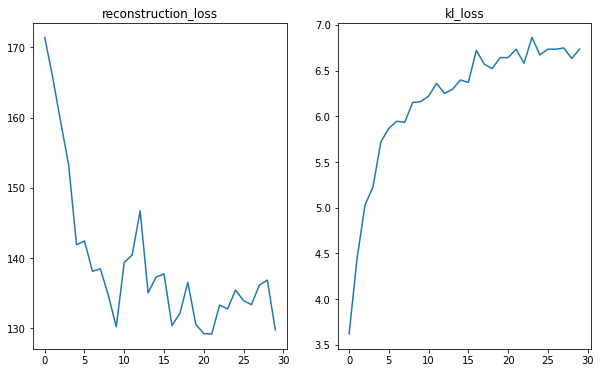

In [12]:
vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
history = vae.fit(x_train, epochs=30, batch_size=128)
plot_loss(history)

##[TO COMPLETE] Exercise 6.5: Model Analysis
Now we can plot an example of the data generation by using the decoder part. Since we used a 2D latent space let's generate sevral possibile 2D $\hat{z}$ samples and pass them to our decoder. With the $scale$ parameter we can define the interval from where the entries of $\hat{z}$ are chosen, and with parameter $n$ it is possibile to define how many samples are generated.  

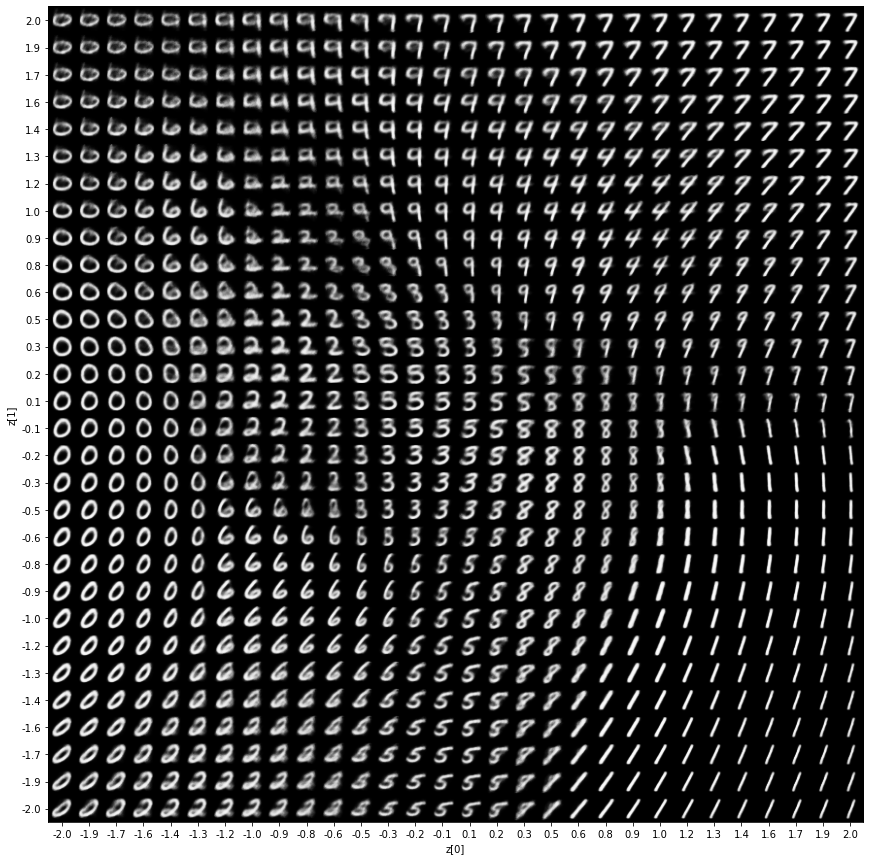

In [13]:
def plot_latent(encoder, decoder, scale=2.0, n = 30):
     
    digit_size = 28
    figsize = 15
    figure = np.zeros((digit_size * n, digit_size * n))

    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = decoder.predict(z_sample)
            digit = x_decoded[0].reshape(digit_size, digit_size)
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size,
            ] = digit

    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()


plot_latent(encoder, decoder, 2.0, 30) 

The final result is quite impressive, considering that all these digits are artificial and they not belong to any dataset!
Let's finally check how the various digits have been represented in the latent space by the VAE.

Scale:  0.5


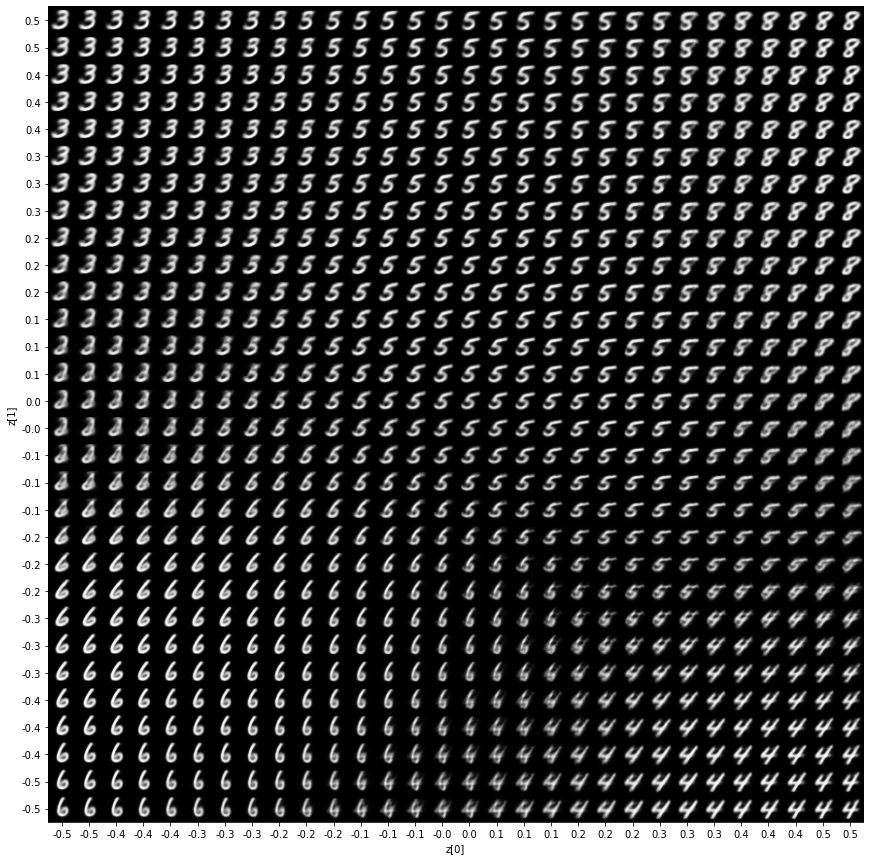

Scale:  1


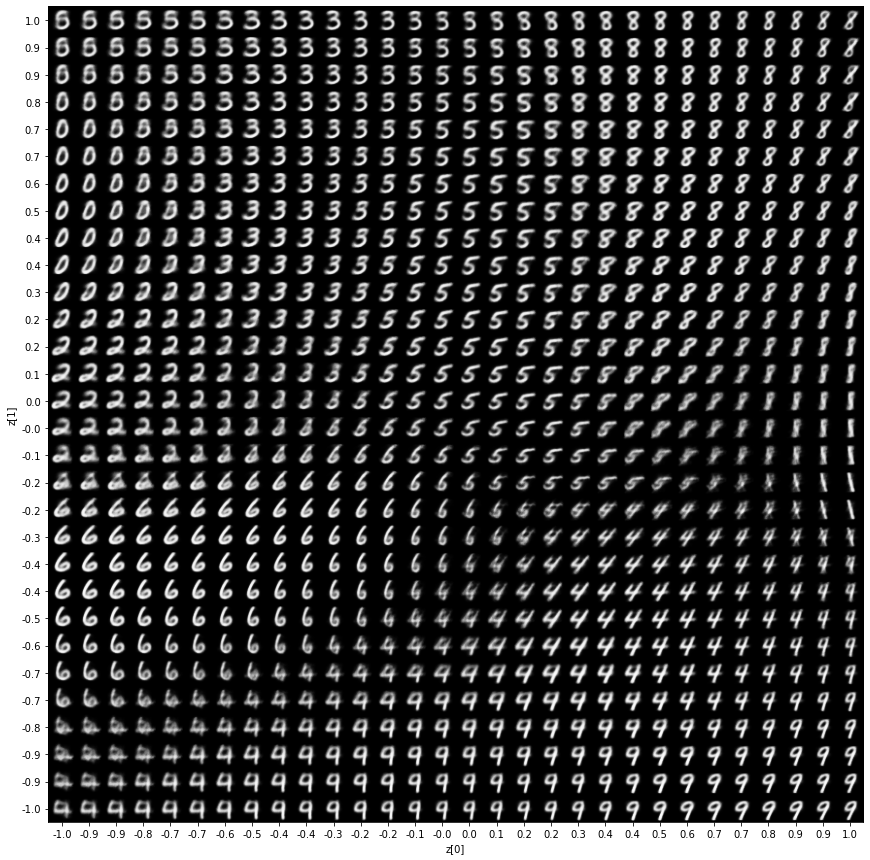

Scale:  4


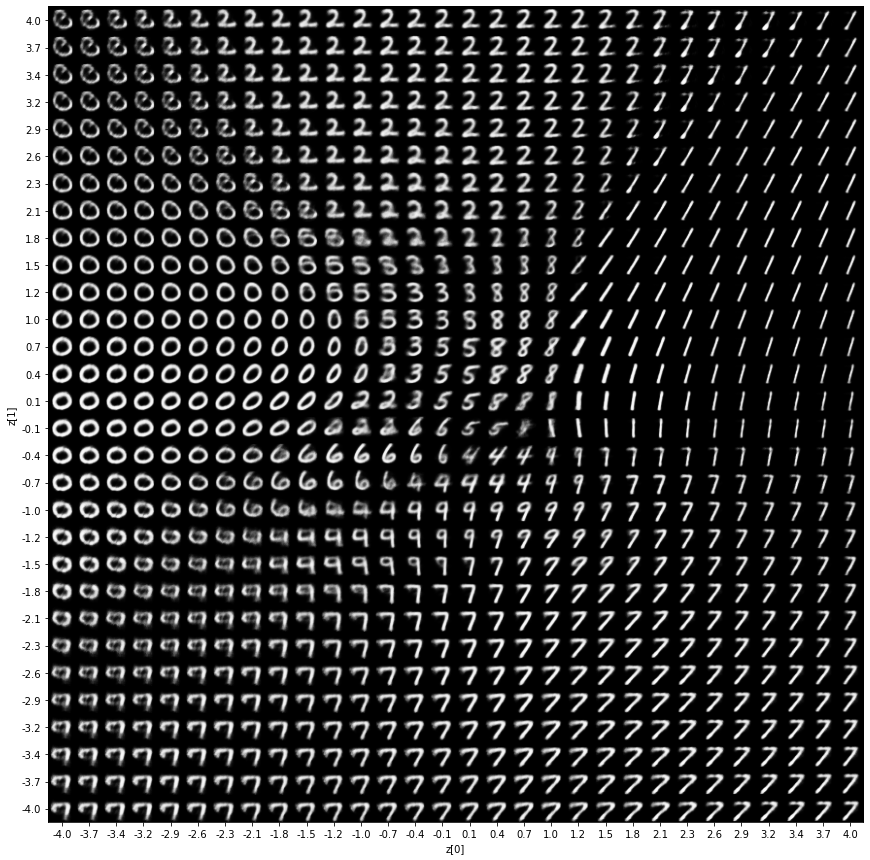

Scale:  8


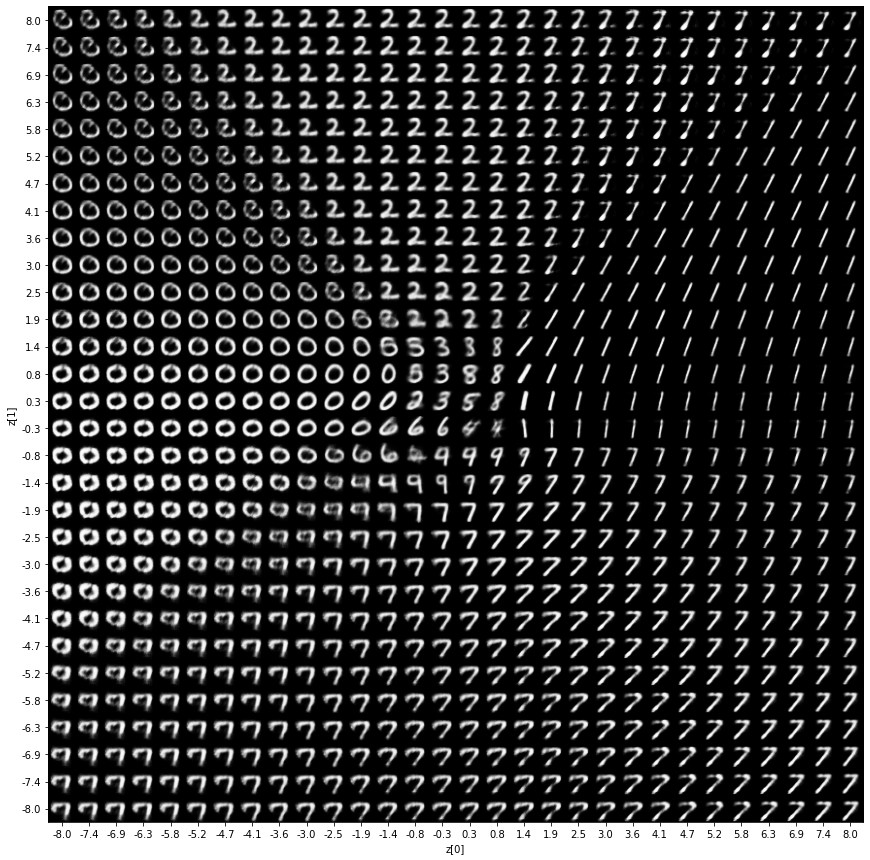

In [42]:
# explore what happens with different "scales"
scales = [0.5, 1, 4, 8]

for scale in scales:
  print('Scale: ', scale)
  plot_latent(encoder, decoder, scale, 30)

As we can see, changing the scales cause the digits the model is able to generate and how they are reconstructed. In particular, for small scales, the model is able to reproduce only few digits. 
<br>
On the other hand, for larger values of scales, the model is able to generate all the digits, but sometimes fails or reconstruct only a portion of them, or a blurred version.

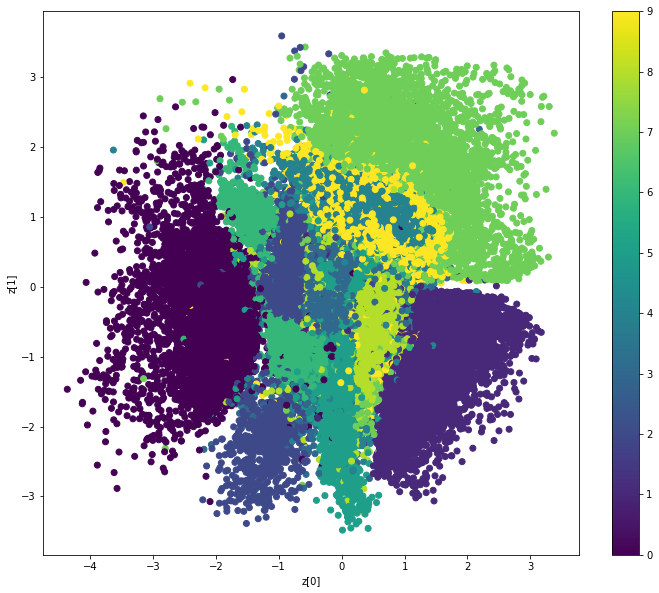

In [14]:
def plot_label_clusters(encoder, decoder, data, labels):
    z_mean, _, _ = encoder.predict(data)
    plt.figure(figsize=(12, 10))
    plt.scatter(z_mean[:, 0], z_mean[:, 1], c=labels)
    plt.colorbar()
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.show()

plot_label_clusters(encoder, decoder, x_train, y_train)

**[TO COMPLETE]** Discuss the obtained plots, and  explore how the hyper-parameters of the VAE (number of layers, layer sizes, etc.) influence the final result. Insert your discussion into cells immediately below this one.

Our baseline model, using to reconstruct digits with scale = 2, is able to represents all the digits between 0 and 9, but for some of them create a blurred or overlapped with other digits version. Now, let's try to improve the model changing the hyper-parameters of the VAE in order to get a better generation of the digits. 
<br>
In particular, let's try to change the number of encoding and decoding layers, the number of units for each layer and the activation functions of the layers.

**Number of layers**

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_18 (InputLayer)          [(None, 784)]        0           []                               
                                                                                                  
 dense_81 (Dense)               (None, 256)          200960      ['input_18[0][0]']               
                                                                                                  
 dense_82 (Dense)               (None, 128)          32896       ['dense_81[0][0]']               
                                                                                                  
 dense_83 (Dense)               (None, 64)           8256        ['dense_82[0][0]']               
                                                                                            

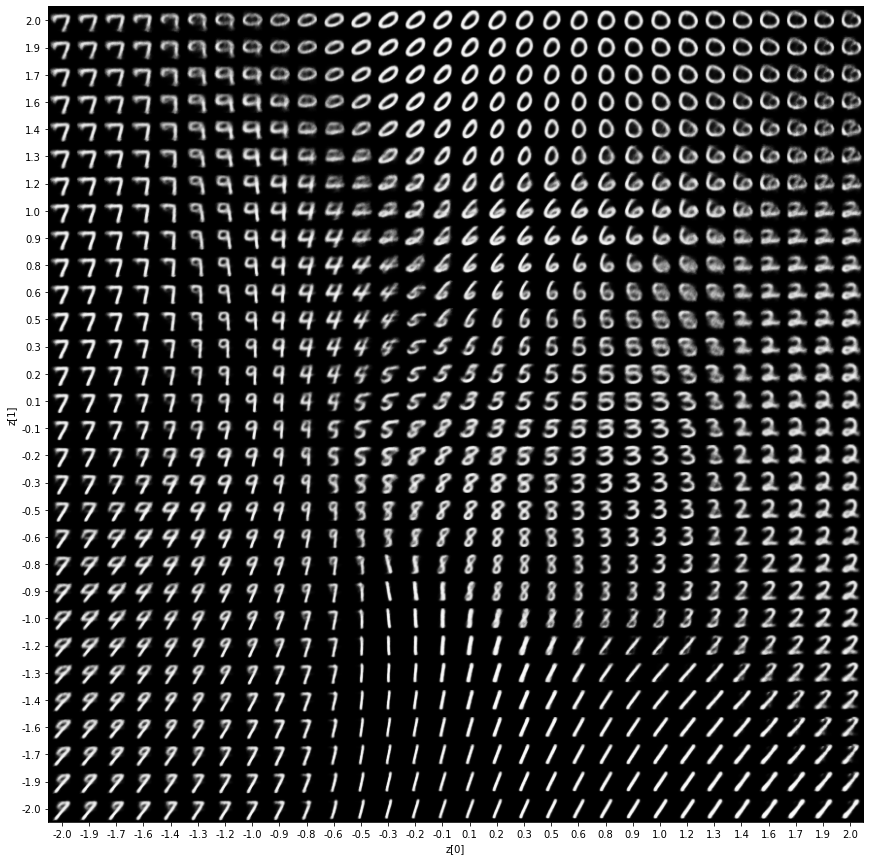

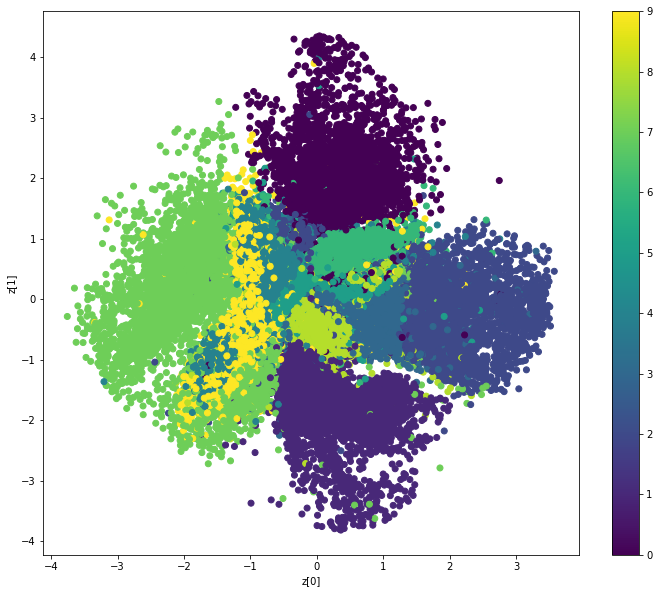

In [20]:
latent_dim = 2
INPUT_DIM = x_train.shape[-1]

#Encoder
encoder_inputs = tf.keras.layers.Input(shape=(INPUT_DIM,))
x = tf.keras.layers.Dense(256, activation = 'sigmoid')(encoder_inputs)
x = tf.keras.layers.Dense(128, activation = 'tanh')(x)
x = tf.keras.layers.Dense(64, activation = 'tanh')(x)
x = tf.keras.layers.Dense(32, activation = 'tanh')(x)

z_mean =  tf.keras.layers.Dense(latent_dim, activation = 'linear')(x)
z_var =  tf.keras.layers.Dense(latent_dim, activation = 'linear')(x)

z = Sampling()([z_mean, z_var])

encoder = tf.keras.Model(encoder_inputs, [z_mean, z_var, z], name="encoder")
encoder.summary()

#Decoder
latent_inputs = keras.Input(shape=(latent_dim,))

x = tf.keras.layers.Dense(32, activation = 'tanh')(latent_inputs)
x = tf.keras.layers.Dense(64, activation = 'tanh')(x)
x = tf.keras.layers.Dense(128, activation = 'tanh')(x)
x = tf.keras.layers.Dense(256, activation = 'sigmoid')(x)

decoder_outputs = tf.keras.layers.Dense(INPUT_DIM, activation = 'sigmoid')(x)

decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(x_train, epochs=30, batch_size=128)

plot_latent(encoder, decoder, 2.0, 30) 
plot_label_clusters(encoder, decoder, x_train, y_train)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_16 (InputLayer)          [(None, 784)]        0           []                               
                                                                                                  
 dense_74 (Dense)               (None, 256)          200960      ['input_16[0][0]']               
                                                                                                  
 dense_75 (Dense)               (None, 128)          32896       ['dense_74[0][0]']               
                                                                                                  
 dense_76 (Dense)               (None, 2)            258         ['dense_75[0][0]']               
                                                                                            

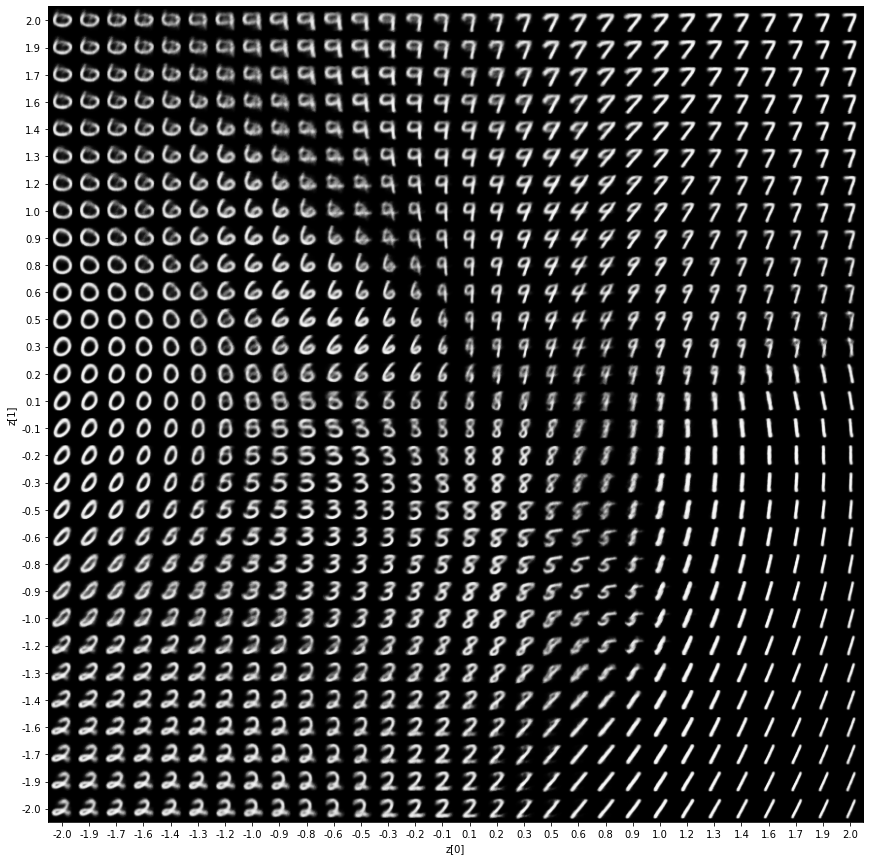

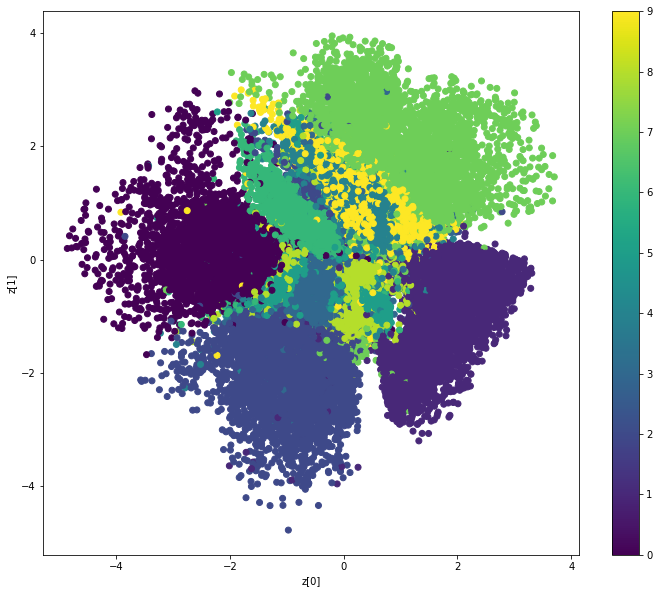

In [19]:
latent_dim = 2
INPUT_DIM = x_train.shape[-1]

#Encoder
encoder_inputs = tf.keras.layers.Input(shape=(INPUT_DIM,))
x = tf.keras.layers.Dense(256, activation = 'sigmoid')(encoder_inputs)
x = tf.keras.layers.Dense(128, activation = 'tanh')(x)

z_mean =  tf.keras.layers.Dense(latent_dim, activation = 'linear')(x)
z_var =  tf.keras.layers.Dense(latent_dim, activation = 'linear')(x)

z = Sampling()([z_mean, z_var])

encoder = tf.keras.Model(encoder_inputs, [z_mean, z_var, z], name="encoder")
encoder.summary()

#Decoder
latent_inputs = keras.Input(shape=(latent_dim,))

x = tf.keras.layers.Dense(128, activation = 'tanh')(latent_inputs)
x = tf.keras.layers.Dense(256, activation = 'sigmoid')(x)

decoder_outputs = tf.keras.layers.Dense(INPUT_DIM, activation = 'sigmoid')(x)

decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(x_train, epochs=30, batch_size=128)

plot_latent(encoder, decoder, 2.0, 30) 
plot_label_clusters(encoder, decoder, x_train, y_train)

**Number of units**

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_22 (InputLayer)          [(None, 784)]        0           []                               
                                                                                                  
 dense_101 (Dense)              (None, 512)          401920      ['input_22[0][0]']               
                                                                                                  
 dense_102 (Dense)              (None, 384)          196992      ['dense_101[0][0]']              
                                                                                                  
 dense_103 (Dense)              (None, 256)          98560       ['dense_102[0][0]']              
                                                                                            

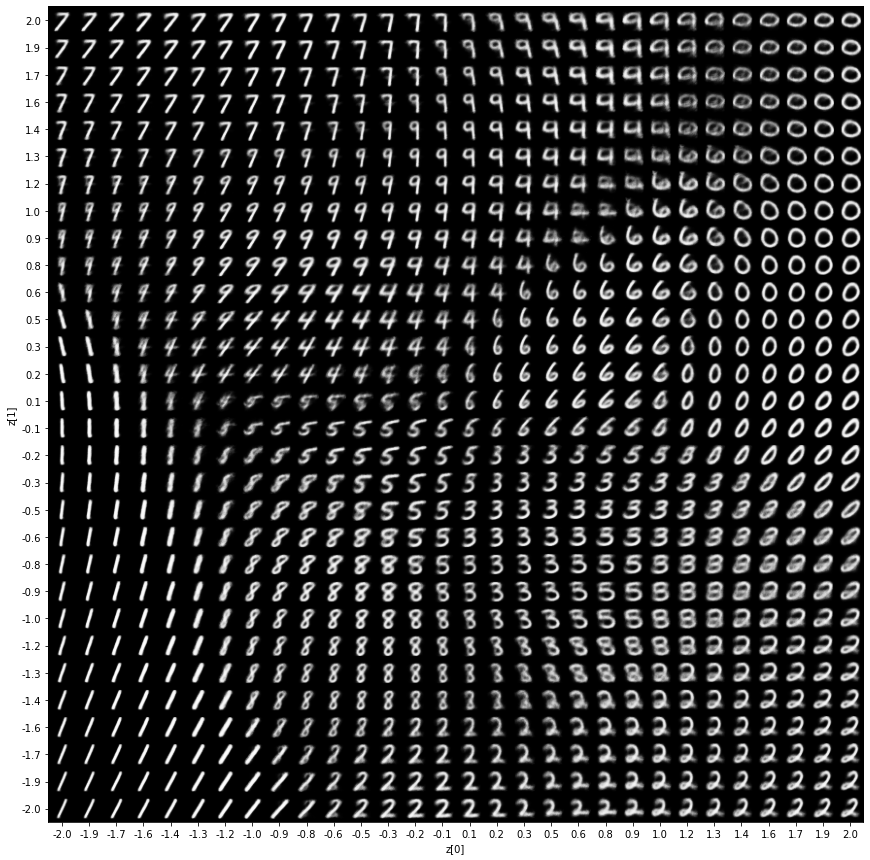

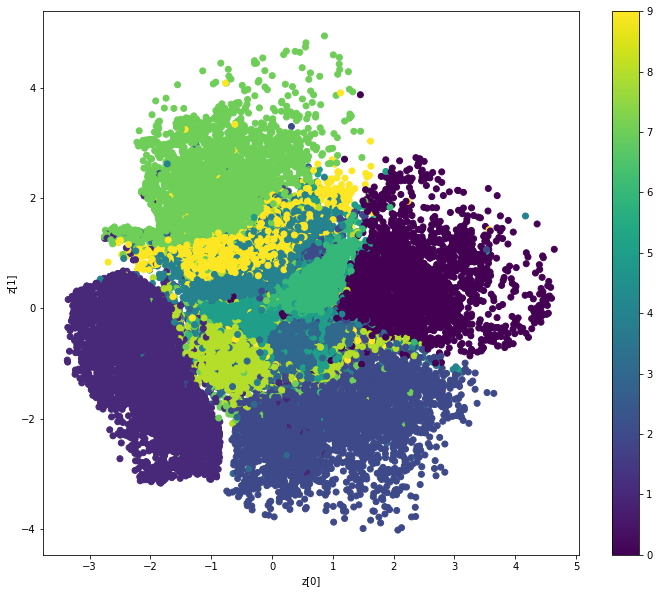

In [22]:
latent_dim = 2
INPUT_DIM = x_train.shape[-1]

#Encoder
encoder_inputs = tf.keras.layers.Input(shape=(INPUT_DIM,))
x = tf.keras.layers.Dense(512, activation = 'sigmoid')(encoder_inputs)
x = tf.keras.layers.Dense(384, activation = 'tanh')(x)
x = tf.keras.layers.Dense(256, activation = 'tanh')(x)

z_mean =  tf.keras.layers.Dense(latent_dim, activation = 'linear')(x)
z_var =  tf.keras.layers.Dense(latent_dim, activation = 'linear')(x)

z = Sampling()([z_mean, z_var])

encoder = tf.keras.Model(encoder_inputs, [z_mean, z_var, z], name="encoder")
encoder.summary()

#Decoder
latent_inputs = keras.Input(shape=(latent_dim,))

x = tf.keras.layers.Dense(256, activation = 'tanh')(latent_inputs)
x = tf.keras.layers.Dense(384, activation = 'tanh')(x)
x = tf.keras.layers.Dense(512, activation = 'sigmoid')(x)

decoder_outputs = tf.keras.layers.Dense(INPUT_DIM, activation = 'sigmoid')(x)

decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(x_train, epochs=30, batch_size=128)

plot_latent(encoder, decoder, 2.0, 30) 
plot_label_clusters(encoder, decoder, x_train, y_train)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_24 (InputLayer)          [(None, 784)]        0           []                               
                                                                                                  
 dense_110 (Dense)              (None, 256)          200960      ['input_24[0][0]']               
                                                                                                  
 dense_111 (Dense)              (None, 64)           16448       ['dense_110[0][0]']              
                                                                                                  
 dense_112 (Dense)              (None, 16)           1040        ['dense_111[0][0]']              
                                                                                            

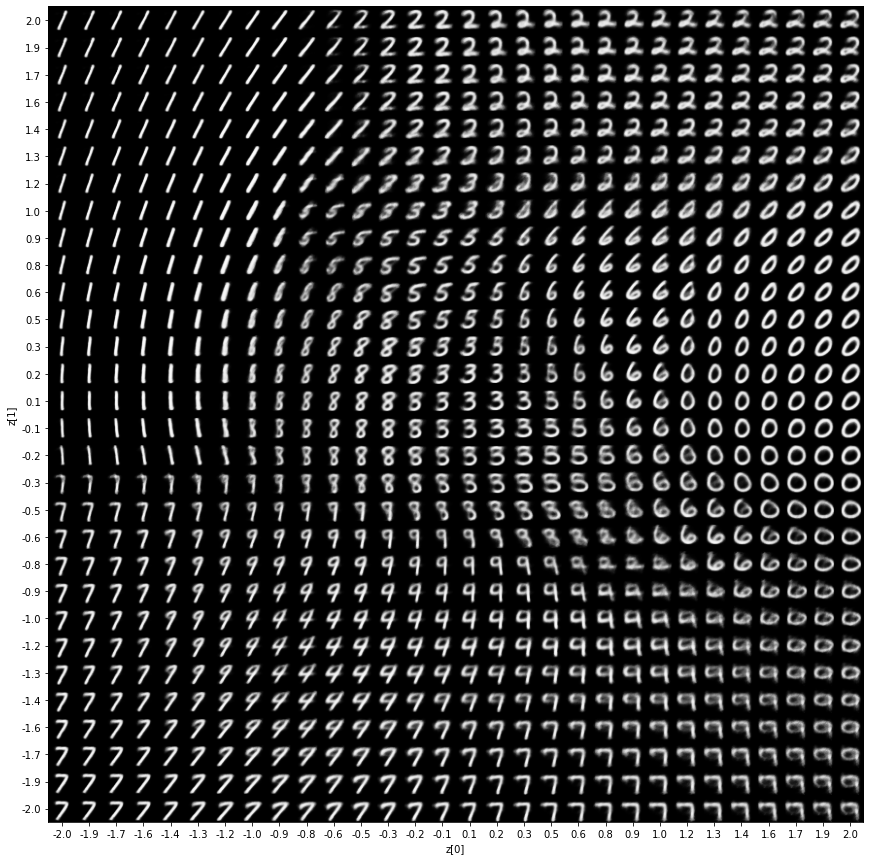

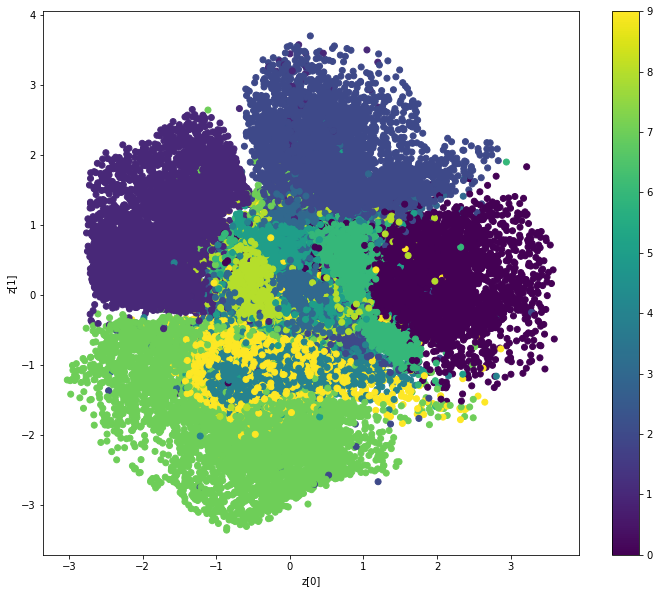

In [23]:
latent_dim = 2
INPUT_DIM = x_train.shape[-1]

#Encoder
encoder_inputs = tf.keras.layers.Input(shape=(INPUT_DIM,))
x = tf.keras.layers.Dense(256, activation = 'sigmoid')(encoder_inputs)
x = tf.keras.layers.Dense(64, activation = 'tanh')(x)
x = tf.keras.layers.Dense(16, activation = 'tanh')(x)

z_mean =  tf.keras.layers.Dense(latent_dim, activation = 'linear')(x)
z_var =  tf.keras.layers.Dense(latent_dim, activation = 'linear')(x)

z = Sampling()([z_mean, z_var])

encoder = tf.keras.Model(encoder_inputs, [z_mean, z_var, z], name="encoder")
encoder.summary()

#Decoder
latent_inputs = keras.Input(shape=(latent_dim,))

x = tf.keras.layers.Dense(16, activation = 'tanh')(latent_inputs)
x = tf.keras.layers.Dense(64, activation = 'tanh')(x)
x = tf.keras.layers.Dense(256, activation = 'sigmoid')(x)

decoder_outputs = tf.keras.layers.Dense(INPUT_DIM, activation = 'sigmoid')(x)

decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(x_train, epochs=30, batch_size=128)

plot_latent(encoder, decoder, 2.0, 30) 
plot_label_clusters(encoder, decoder, x_train, y_train)

**Activation function**

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_26 (InputLayer)          [(None, 784)]        0           []                               
                                                                                                  
 dense_119 (Dense)              (None, 512)          401920      ['input_26[0][0]']               
                                                                                                  
 dense_120 (Dense)              (None, 256)          131328      ['dense_119[0][0]']              
                                                                                                  
 dense_121 (Dense)              (None, 128)          32896       ['dense_120[0][0]']              
                                                                                            

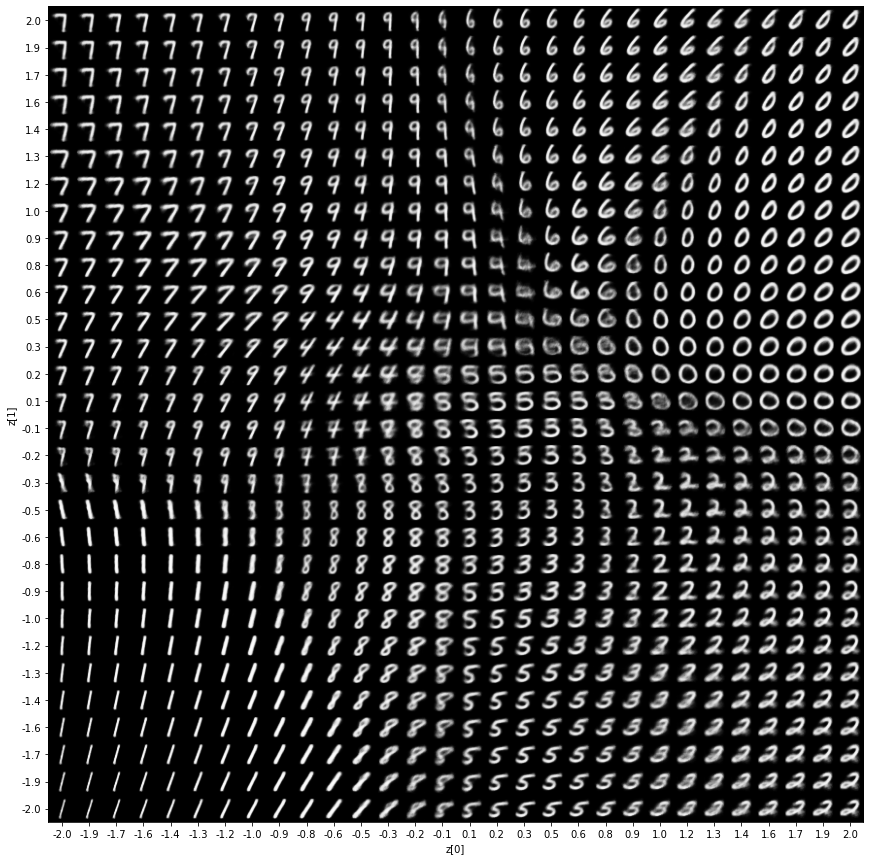

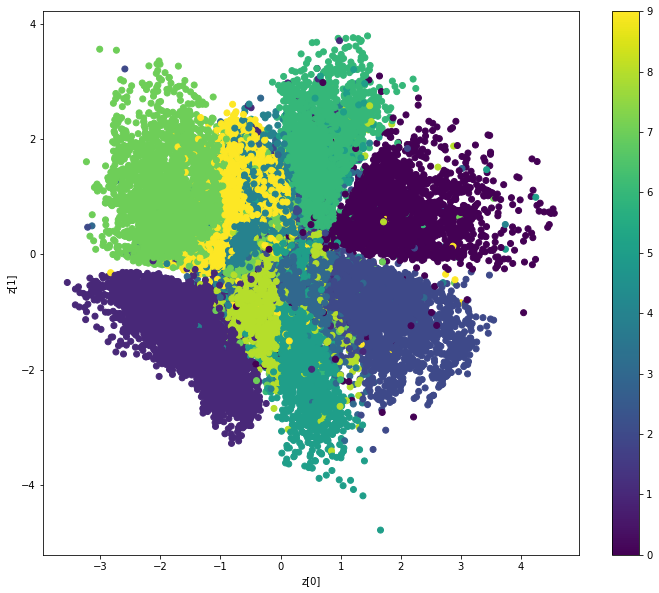

In [24]:
latent_dim = 2
INPUT_DIM = x_train.shape[-1]

#Encoder
encoder_inputs = tf.keras.layers.Input(shape=(INPUT_DIM,))
x = tf.keras.layers.Dense(512, activation = 'relu')(encoder_inputs)
x = tf.keras.layers.Dense(256, activation = 'relu')(x)
x = tf.keras.layers.Dense(128, activation = 'tanh')(x)

z_mean =  tf.keras.layers.Dense(latent_dim, activation = 'linear')(x)
z_var =  tf.keras.layers.Dense(latent_dim, activation = 'linear')(x)

z = Sampling()([z_mean, z_var])

encoder = tf.keras.Model(encoder_inputs, [z_mean, z_var, z], name="encoder")
encoder.summary()

#Decoder
latent_inputs = keras.Input(shape=(latent_dim,))

x = tf.keras.layers.Dense(128, activation = 'tanh')(latent_inputs)
x = tf.keras.layers.Dense(256, activation = 'relu')(x)
x = tf.keras.layers.Dense(512, activation = 'relu')(x)

decoder_outputs = tf.keras.layers.Dense(INPUT_DIM, activation = 'sigmoid')(x)

decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(x_train, epochs=30, batch_size=128)

plot_latent(encoder, decoder, 2.0, 30) 
plot_label_clusters(encoder, decoder, x_train, y_train)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_30 (InputLayer)          [(None, 784)]        0           []                               
                                                                                                  
 dense_137 (Dense)              (None, 512)          401920      ['input_30[0][0]']               
                                                                                                  
 dense_138 (Dense)              (None, 256)          131328      ['dense_137[0][0]']              
                                                                                                  
 dense_139 (Dense)              (None, 128)          32896       ['dense_138[0][0]']              
                                                                                            

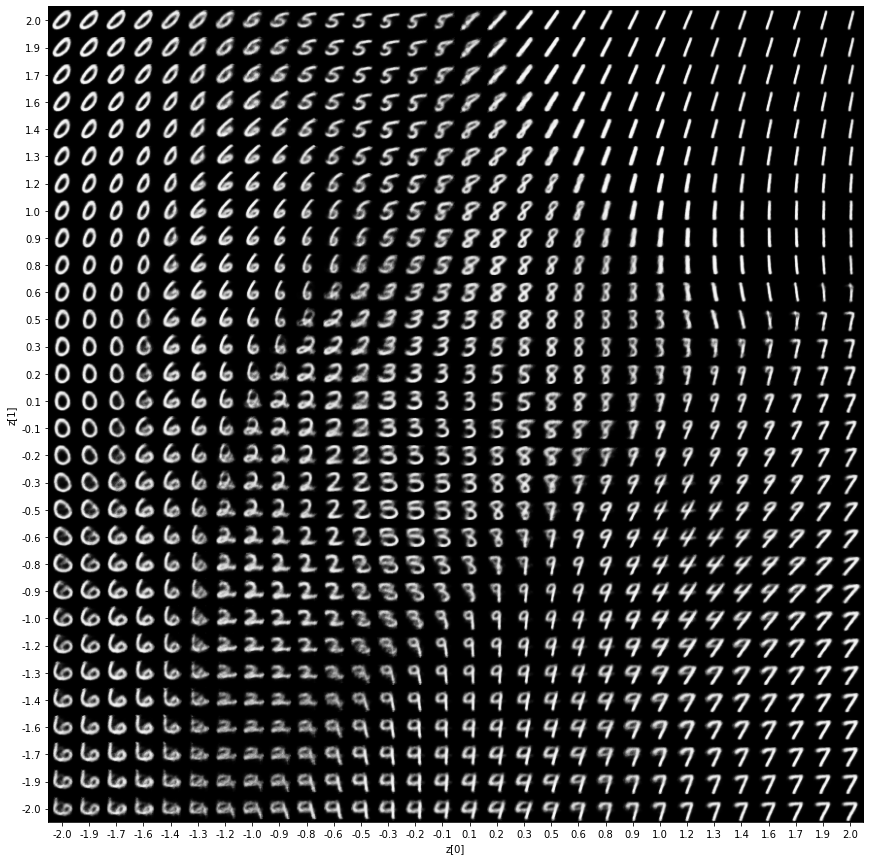

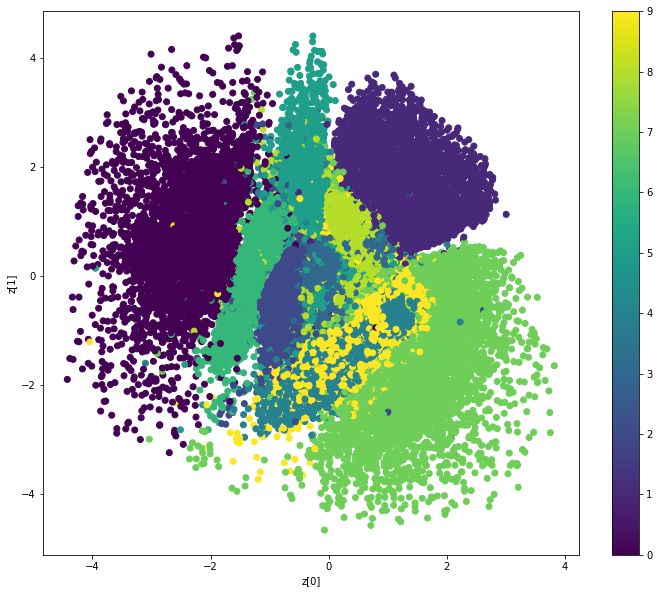

In [26]:
latent_dim = 2
INPUT_DIM = x_train.shape[-1]

#Encoder
encoder_inputs = tf.keras.layers.Input(shape=(INPUT_DIM,))
x = tf.keras.layers.Dense(512, activation = 'tanh')(encoder_inputs)
x = tf.keras.layers.Dense(256, activation = tf.keras.layers.LeakyReLU())(x)
x = tf.keras.layers.Dense(128, activation = tf.keras.layers.LeakyReLU())(x)

z_mean =  tf.keras.layers.Dense(latent_dim, activation = 'linear')(x)
z_var =  tf.keras.layers.Dense(latent_dim, activation = 'linear')(x)

z = Sampling()([z_mean, z_var])

encoder = tf.keras.Model(encoder_inputs, [z_mean, z_var, z], name="encoder")
encoder.summary()

#Decoder
latent_inputs = keras.Input(shape=(latent_dim,))

x = tf.keras.layers.Dense(128, activation = tf.keras.layers.LeakyReLU())(latent_inputs)
x = tf.keras.layers.Dense(256, activation = tf.keras.layers.LeakyReLU())(x)
x = tf.keras.layers.Dense(512, activation = 'tanh')(x)

decoder_outputs = tf.keras.layers.Dense(INPUT_DIM, activation = 'sigmoid')(x)

decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(x_train, epochs=30, batch_size=128)

plot_latent(encoder, decoder, 2.0, 30) 
plot_label_clusters(encoder, decoder, x_train, y_train)

**Answer:** 

As we can see in the above code cells, the results are quite similar between each other. However, I noted that increasing the number of layers or increasing the number of units for each layer leads to a slightly better result in the generation of the digits with respect to decreasing the same type of parameter. It seems to me that the digits are less blurred and are reconstructed in a sharper way.
<br>
The reason could be that, increasing the number of layers or units will enhance the number of the trainable parameters and as consequence the capacity of our VAE, letting it to extract in a better way the features and separate clearer the output results.

In addition, I tried an architecture with the addition of the ReLU as activation function. In the specific, I set the three encoding layers respectively to *tanh*, *ReLU*, *ReLU* (and vice-versa in the encoding) and obtained slightly better results than the baseline model. The reason could be, as discussed in the previous cells, the first derivative of the activation function. In particular, ReLU is defined as follows:

\begin{equation}
ReLU(x)=
    \begin{cases}
        0 & \text{if } x < 0\\
        x & \text{if } x \geq 0
    \end{cases}
\end{equation}

and the first derivative is:

\begin{equation}
(ReLU(x))'=
    \begin{cases}
        0 & \text{if } x < 0\\
        1 & \text{if } x \geq 0
    \end{cases}
\end{equation}

i.e., always a constant value, either 0 or 1. It is computationally efficient and can cope with discrete results with the vanishing gradient problems. The same reason could be applied in the last example, where LeakyReLU is tried ($LeakyReLU(x) = max\ \{\alpha \ x, \ x\}$, where alpha is an hyperparameter, in our case by default $\alpha = 0.3$).
